In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from scipy.signal import find_peaks
import os

In [2]:
def read_s2p_file(file_path):
    """
    Reads a .s2p file and processes it into a pandas DataFrame.

    Parameters:
        file_path (str): The path to the .s2p file to be read.

    Returns:
        pandas.DataFrame: A DataFrame containing the data from the .s2p file with columns for frequency and S-parameters.
    """
    # Open the file and read all lines
    with open(file_path, 'r') as file:
        lines = file.readlines()
    
    # Skip lines that start with '#' or '!' (typically headers or comments in .s2p files)
    data = [line.strip().split() for line in lines if not (line.startswith('#') or line.startswith('!'))]
    
    # Convert the processed data into a DataFrame with appropriate column names
    df = pd.DataFrame(data, columns=[
        'Frequency (Hz)', 'S11 (dB)', 'S11 (Angle)', 
        'S21 (dB)', 'S21 (Angle)', 'S12 (dB)', 
        'S12 (Angle)', 'S22 (dB)', 'S22 (Angle)'
    ])
    
    # Convert all columns to numeric values (since the file data is in string format initially)
    df = df.apply(pd.to_numeric)
    
    # Return the DataFrame containing the processed data
    return df


Meto todala data en unos diccionarios para tener mas orden, solo tener que loadearla una vez, y que sea facil de acceder


In [3]:
# Directories
directories = {
    "Citi1_P12_PreAmp": r'/home/lautaro/GitHub/Laboratorio_6_7_ITeDA/Mediciones/Mediciones CITI VNA/2024-10-29/Citi1-P12-PreAmp',
    "Citi1_P23_PreAmp": r'/home/lautaro/GitHub/Laboratorio_6_7_ITeDA/Mediciones/Mediciones CITI VNA/2024-11-08/Citi1-P23-PreAmp',
    "Citi2_P7_PreAmp": r'/home/lautaro/GitHub/Laboratorio_6_7_ITeDA/Mediciones/Mediciones CITI VNA/2024-11-08/Citi2-P7-PreAmp',
    "Citi2_P28_PreAmp": r'/home/lautaro/GitHub/Laboratorio_6_7_ITeDA/Mediciones/Mediciones CITI VNA/2024-11-08/Citi2-P28-PreAmp'
}

# Dictionary to hold data for all directories
data = {key: {} for key in directories.keys()}

# Load all .s2p files once
for key, directory in directories.items():
    for i in range(64):
        file_path = os.path.join(directory, f'ganancia_{i}.s2p')
        data[key][i] = read_s2p_file(file_path)
        

Meto la calibracion que tengo hecha del Citi2 Puerto7

Highest Standard Deviation (S21) below 30000000.0 Hz: 0.06121686150392559 dB


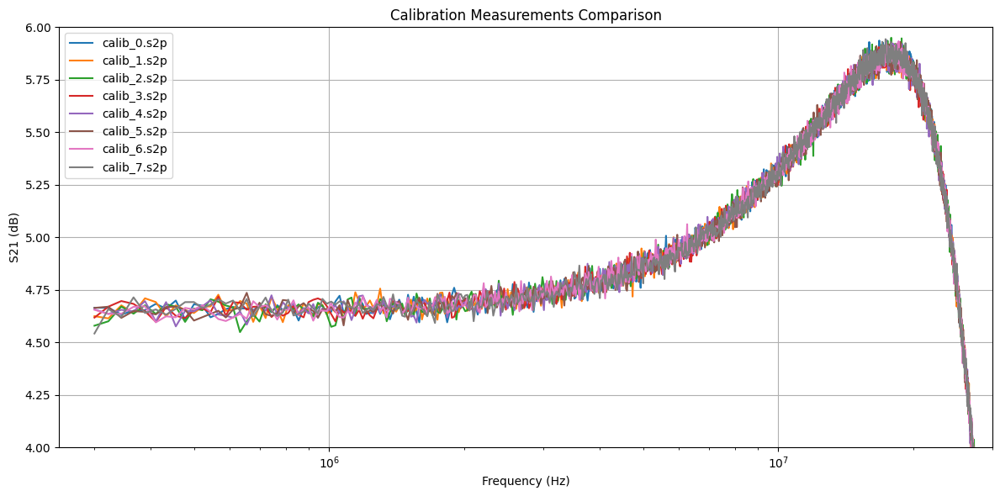

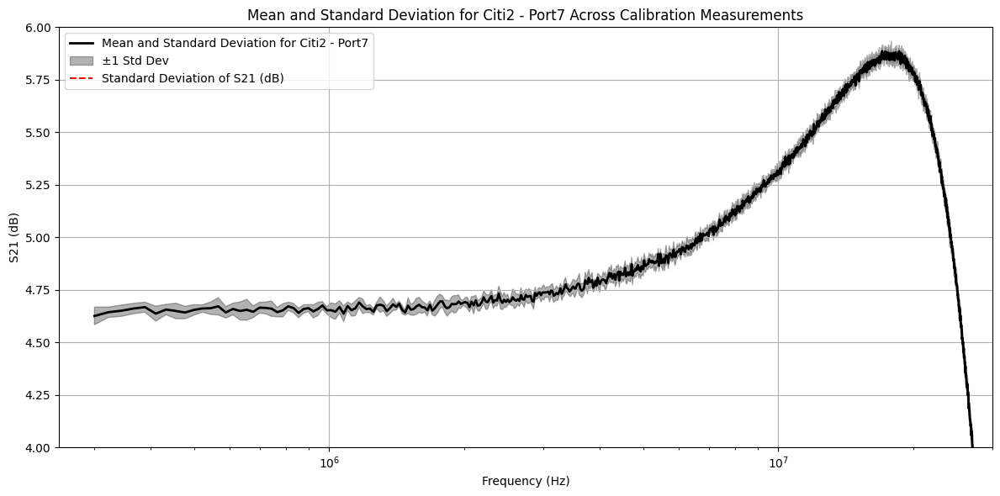

In [4]:
# Read the calibration files only once
calibration_dir = '/home/lautaro/GitHub/Laboratorio_6_7_ITeDA/Mediciones/Mediciones CITI VNA/2024-11-08/Calibracion - C2-P7-PA'
calib_files = [f'calib_{i}.s2p' for i in range(8)]  # calib_0 to calib_7
calib_data = {}

# Read all calibration files into a dictionary
for calib_file in calib_files:
    file_path = os.path.join(calibration_dir, calib_file)
    calib_data[calib_file] = read_s2p_file(file_path)

# Now proceed with the mean and standard deviation calculation, using the already loaded data
frequencies = calib_data['calib_0.s2p']['Frequency (Hz)']  # All files have the same frequency range
mean_s21 = np.mean([df['S21 (dB)'] for df in calib_data.values()], axis=0)
std_s21 = np.std([df['S21 (dB)'] for df in calib_data.values()], axis=0)

# Find the indices of the frequencies below the cutoff
frequency_cutoff = 3e7
below_cutoff_indices = frequencies <= frequency_cutoff

# Extract the standard deviation values before the cutoff
std_s21_below_cutoff = std_s21[below_cutoff_indices]

# Find the maximum standard deviation before the cutoff
max_std_below_cutoff = np.max(std_s21_below_cutoff)

# Print the highest standard deviation below the cutoff
print(f"Highest Standard Deviation (S21) below {frequency_cutoff} Hz: {max_std_below_cutoff} dB")


# Plot the calibration measurements and their mean (using the already loaded data)
plt.figure(figsize=(12, 6))
for calib_file in calib_files:  # Iterate over string keys directly
    plt.plot(calib_data[calib_file]['Frequency (Hz)'], calib_data[calib_file]['S21 (dB)'], label=f'{calib_file}')
plt.xlabel('Frequency (Hz)')
plt.ylabel('S21 (dB)')
plt.ylim(4, 6)
plt.xlim(2.5e5, 3e7)
plt.xscale('log')
plt.title('Calibration Measurements Comparison')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# Plot the Mean and Standard Deviation S21 (dB) in a separate plot
plt.figure(figsize=(12, 6))
plt.plot(frequencies, mean_s21, label='Mean and Standard Deviation for Citi2 - Port7', color='black', linewidth=2)
plt.fill_between(frequencies, mean_s21 - std_s21, mean_s21 + std_s21, alpha=0.3, color='black', label='±1 Std Dev')
plt.plot(frequencies, std_s21, label='Standard Deviation of S21 (dB)', color='red', linestyle='--')
plt.xlabel('Frequency (Hz)')
plt.ylabel('S21 (dB)')
plt.xscale('log')
plt.ylim(4, 6)
plt.xlim(2.5e5, 3e7)
plt.title('Mean and Standard Deviation for Citi2 - Port7 Across Calibration Measurements')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

Voy a poner algunas de las funciones que voy a ir usando muchas veces aca arriba:

- Funcion que me plotea los datos crudos que separa pares de impares
- Clase para todo el analisis de residuos:
  * Plotear todos los residuos de todas la ganancias
  * Plotear un mapa de calor para ver cuales son las ganancias mas diferentes rapido
  * Ver el valor medio y STD de todos los residuos
  * Lo mismo arriba del cuttoff que pongo donde empieza a haber mucho ruido

In [5]:
def plot_even_odd_gains(data, dataset_1, dataset_2):
    """
    Plots even and odd gain indices separately, including dataset names in the title.

    Parameters:
        data (dict): Preloaded dictionary containing gain data for each dataset.
        dataset_1 (str): Key for the first dataset in the data dictionary.
        dataset_2 (str): Key for the second dataset in the data dictionary.
    """
    linestyle_map = {dataset_1: '-', dataset_2: '--'}
    
    # Define ranges for even and odd indices
    ranges = {'Even Gains': range(0, 64, 2), 'Odd Gains': range(1, 64, 2)}
    
    for gain_type, indices in ranges.items():
        plt.figure(figsize=(12, 8))
        
        for i in indices:
            df_1 = data[dataset_1][i]
            df_2 = data[dataset_2][i]
            
            # Plot for each gain index
            plt.plot(df_1['Frequency (Hz)'], df_1['S21 (dB)'], 
                     label=f'{dataset_1} Gain {i}', linestyle=linestyle_map[dataset_1])
            plt.plot(df_2['Frequency (Hz)'], df_2['S21 (dB)'], 
                     label=f'{dataset_2} Gain {i}', linestyle=linestyle_map[dataset_2])
        
        # Customize plot
        plt.xlabel('Frequency (Hz)')
        plt.ylim(4, 41)
        plt.xscale('log')
        plt.ylabel('S21 (dB)')
        plt.xlim(2.5e5, 3e7)
        plt.title(f'S21 (dB) Comparison: {dataset_1} vs {dataset_2} - {gain_type}')
        plt.legend(loc='upper right', bbox_to_anchor=(1.25, 1), ncol=2, fontsize='small')
        plt.tight_layout()
        plt.grid()
        plt.show()


In [6]:
class ResidualAnalysis:
    def __init__(self, data, dataset_1_key, dataset_2_key, max_std, frequency_cutoff=5e7, exclude_gains=None):
        """
        Initializes the ResidualAnalysis class with the selected datasets, calibration data, frequency cutoff, and optional gain exclusions.

        Parameters:
            data (dict): Dictionary containing gain data for each dataset.
            dataset_1_key (str): The key for the first dataset (e.g., 'Citi1_P12_PreAmp').
            dataset_2_key (str): The key for the second dataset (e.g., 'Citi1_P23_PreAmp').
            calibration_data (dict): Dictionary containing calibration residuals for each gain (e.g., 'calib_0' to 'calib_7').
            frequency_cutoff (float): Frequency cutoff value in Hz (default is 50 MHz).
            exclude_gains (list): List of gain indices to exclude (default is None, meaning no exclusion).
        """
        self.data = data
        self.dataset_1_key = dataset_1_key
        self.dataset_2_key = dataset_2_key
        self.max_std = max_std
        self.frequency_cutoff = frequency_cutoff
        self.exclude_gains = exclude_gains if exclude_gains is not None else []
        self.residuals_below_cutoff = []
        self.residuals_above_cutoff = []
        self.frequencies_below_cutoff = []
        self.frequencies_above_cutoff = []

    def calculate_residuals_below_cutoff(self):
        """
        Calculates the residuals below the frequency cutoff, excluding outlier gains, and stores them.
        """
        for i in range(64):
            if i in self.exclude_gains:  # Skip gains in the exclude list
                continue
            
            df_citi1_p12_preamp = self.data[self.dataset_1_key][i]
            df_citi1_p23_preamp = self.data[self.dataset_2_key][i]
            
            # Filter data below the frequency cutoff
            df_below_cutoff_p12 = df_citi1_p12_preamp[df_citi1_p12_preamp['Frequency (Hz)'] <= self.frequency_cutoff]
            df_below_cutoff_p23 = df_citi1_p23_preamp[df_citi1_p23_preamp['Frequency (Hz)'] <= self.frequency_cutoff]
            
            # Calculate residuals
            self.residuals_below_cutoff.append(df_below_cutoff_p12['S21 (dB)'].values - df_below_cutoff_p23['S21 (dB)'].values)
            if i == 0:
                self.frequencies_below_cutoff = df_below_cutoff_p12['Frequency (Hz)'].values
        
        self.residuals_below_cutoff = np.array(self.residuals_below_cutoff)
    
    def calculate_residuals_above_cutoff(self):
        """
        Calculates the residuals above the frequency cutoff, excluding outlier gains, and stores them.
        """
        for i in range(64):
            if i in self.exclude_gains:  # Skip gains in the exclude list
                continue
            
            df_above_cutoff_p12 = self.data[self.dataset_1_key][i][self.data[self.dataset_1_key][i]['Frequency (Hz)'] > self.frequency_cutoff]
            df_above_cutoff_p23 = self.data[self.dataset_2_key][i][self.data[self.dataset_2_key][i]['Frequency (Hz)'] > self.frequency_cutoff]
            
            # Calculate residuals for frequencies above the cutoff
            self.residuals_above_cutoff.append(df_above_cutoff_p12['S21 (dB)'].values - df_above_cutoff_p23['S21 (dB)'].values)
            if i == 0:
                self.frequencies_above_cutoff = df_above_cutoff_p12['Frequency (Hz)'].values
        
        self.residuals_above_cutoff = np.array(self.residuals_above_cutoff)
    
    def plot_heatmap_below_cutoff(self):
        """
        Generates and plots a heatmap for residuals below the frequency cutoff.
        """
        plt.figure(figsize=(14, 8))
        selected_freq_indices = np.linspace(0, len(self.frequencies_below_cutoff) - 1, num=10, dtype=int)
        selected_freq_labels = [f'{self.frequencies_below_cutoff[i]:.2e}' for i in selected_freq_indices]
        
        # Adjust for excluded gains (skip indices)
        valid_residuals = [residuals for i, residuals in enumerate(self.residuals_below_cutoff) if i not in self.exclude_gains]
        
        sns.heatmap(valid_residuals, cmap="coolwarm", xticklabels=selected_freq_indices, yticklabels=[i for i in range(64) if i not in self.exclude_gains])
        plt.xlabel('Frequency (Hz)')
        plt.xticks(ticks=selected_freq_indices, labels=selected_freq_labels, rotation=45)
        plt.ylabel('Gain Index')
        plt.title(f'Residuals Heatmap (S21 {self.dataset_1_key} - {self.dataset_2_key}) Below {self.frequency_cutoff/1e6} MHz')
        plt.show()

    def plot_mean_and_std_above_cutoff(self):
        """
        Generates and plots the mean and standard deviation of residuals above the frequency cutoff.
        """
        mean_residuals_above_cutoff = np.mean(self.residuals_above_cutoff, axis=0)
        std_residuals_above_cutoff = np.std(self.residuals_above_cutoff, axis=0)
        
        plt.figure(figsize=(12, 6))
        plt.plot(self.frequencies_above_cutoff, mean_residuals_above_cutoff, label='Mean Residual (Smoothed)')
        plt.fill_between(self.frequencies_above_cutoff, mean_residuals_above_cutoff - std_residuals_above_cutoff,
                         mean_residuals_above_cutoff + std_residuals_above_cutoff, alpha=0.2, label='±1 Std Dev (Smoothed)')
        plt.xscale('log')
        plt.xlabel('Frequency (Hz)')
        plt.ylabel('Residual (dB)')
        plt.title(f'Mean and Standard Deviation of Residuals Above {self.frequency_cutoff/1e6} MHz')
        plt.legend()
        plt.grid()
        plt.show()
    
    def plot_mean_and_std_below_cutoff(self):
        """
        Generates and plots the mean and standard deviation of residuals below the frequency cutoff.
        Adds horizontal lines at 2 * max_std_below_cutoff and -2 * max_std_below_cutoff, and shades the area between them.
        """
        mean_residuals_below_cutoff = np.mean(self.residuals_below_cutoff, axis=0)
        std_residuals_below_cutoff = np.std(self.residuals_below_cutoff, axis=0)
        
        plt.figure(figsize=(12, 6))
        plt.plot(self.frequencies_below_cutoff, mean_residuals_below_cutoff, label='Mean Residual')
        plt.fill_between(self.frequencies_below_cutoff, mean_residuals_below_cutoff - std_residuals_below_cutoff,
                             mean_residuals_below_cutoff + std_residuals_below_cutoff, alpha=0.2, label='±1 Std Dev')
        
        # Add horizontal lines at 2 * max_std and -2 * max_std
        plt.axhline(y=2 * self.max_std, color='green', linestyle='--', label='2 * max_std_below_cutoff')
        plt.axhline(y=-2 * self.max_std, color='red', linestyle='--', label='-2 * max_std_below_cutoff')
        
        # Fill the area between the two horizontal lines with a faded color
        plt.fill_between(self.frequencies_below_cutoff, 2 * self.max_std, -2 * self.max_std, color='grey', alpha=0.2)
    
        plt.xscale('log')
        plt.xlabel('Frequency (Hz)')
        plt.ylabel('Residual (dB)')
        plt.title(f'Mean and Standard Deviation of Residuals Below {self.frequency_cutoff/1e6} MHz')
        plt.legend()
        plt.grid()
        plt.show()

    def plot_residuals(self):
        """
        Plots the residuals (S21 difference) for all gain indices in separate subplots, excluding gains with outliers.
        Adds horizontal lines at 2 * max_std_below_cutoff and -2 * max_std_below_cutoff, and shades the area between them.
        """
        # Create a subplot grid (16x4)
        fig, axes = plt.subplots(16, 4, figsize=(20, 40), sharex=True, sharey=True)
        axes = axes.flatten()
    
        # Loop through all gain indices
        valid_gain_indices = [i for i in range(64) if i not in self.exclude_gains]
    
        for i, valid_index in enumerate(valid_gain_indices):
            # Access the data for the current gain index
            df_1 = self.data[self.dataset_1_key][valid_index]
            df_2 = self.data[self.dataset_2_key][valid_index]
        
            # Calculate the residuals (difference between the two datasets' S21 values)
            residuals = df_1['S21 (dB)'] - df_2['S21 (dB)']
        
            # Plot residuals for each gain index
            axes[i].plot(df_1['Frequency (Hz)'], residuals, label=f'Residual Gain {valid_index}')
            axes[i].set_xscale('log')
            axes[i].grid()
            axes[i].set_xlim(3e5, 3e7)
            axes[i].set_ylim(-0.9, 0.9)
            axes[i].set_title(f'Residuals for Gain {valid_index}')
        
            # Add horizontal lines at 2 * max_std and -2 * max_std
            axes[i].axhline(y=2 * self.max_std, color='green', linestyle='--', label='2 * max_std_below_cutoff')
            axes[i].axhline(y=-2 * self.max_std, color='red', linestyle='--', label='-2 * max_std_below_cutoff')
        
            # Shade the area between the two horizontal lines
            axes[i].fill_between(df_1['Frequency (Hz)'], 2 * self.max_std, -2 * self.max_std, color='grey', alpha=0.2)

            # Label y-axis on the leftmost plots
            if i % 4 == 0:
                axes[i].set_ylabel('Residual (dB)')
            
            # Label x-axis on the bottom plots
            if i >= len(valid_gain_indices) - 4:  # Modify to ensure x-axis labels appear only at the bottom
                axes[i].set_xlabel('Frequency (Hz)')
    
        # Add an overall title and adjust the layout
        fig.suptitle(f'Residuals of S21 (dB) Difference: {self.dataset_1_key} - {self.dataset_2_key}', fontsize=16)
        plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust the layout to avoid overlap
        plt.show()


# Plot de datos crudos medidos por los pines normales

### Citi1 P12 PreAmp

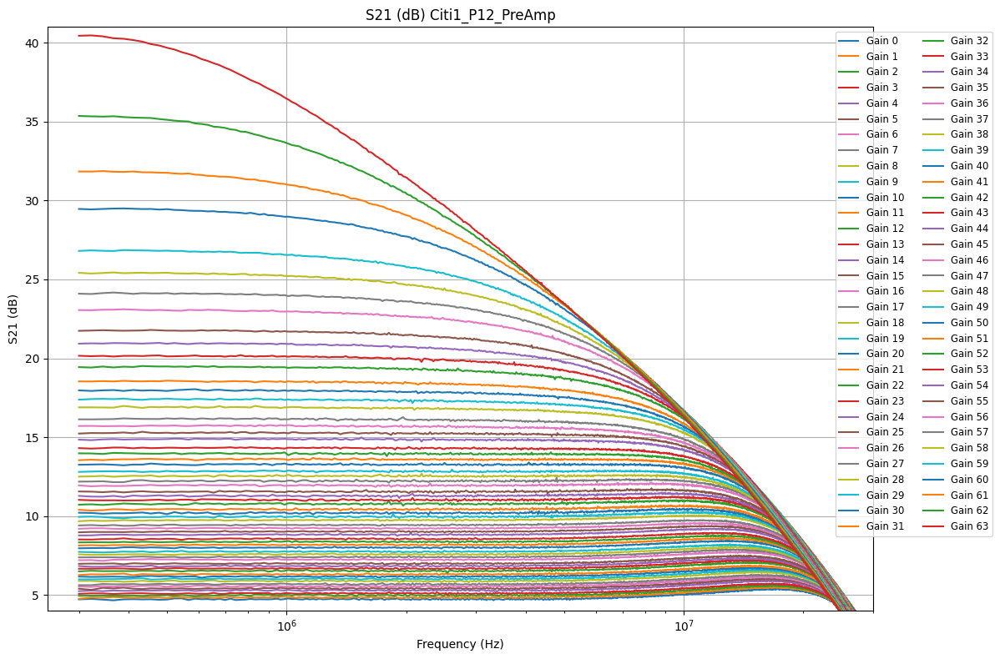

In [7]:
plt.figure(figsize=(12, 8))

# Loop through the preloaded data for Citi1_P12_PreAmp
for i in range(64):
    df_citi1_p12_preamp = data['Citi1_P12_PreAmp'][i]
    
    # Plot S21 (dB) vs Frequency (Hz)
    plt.plot(df_citi1_p12_preamp['Frequency (Hz)'], df_citi1_p12_preamp['S21 (dB)'], label=f'Gain {i}')

# Customize the plot
plt.xlabel('Frequency (Hz)')
plt.ylim(4, 41)
plt.xscale('log')
plt.ylabel('S21 (dB)')
plt.xlim(2.5e5, 3e7)
plt.title('S21 (dB) Citi1_P12_PreAmp')
plt.legend(loc='upper right', bbox_to_anchor=(1.15, 1), ncol=2, fontsize='small')
plt.tight_layout()
plt.grid()
plt.show()

### Citi1 P23 PreAmp

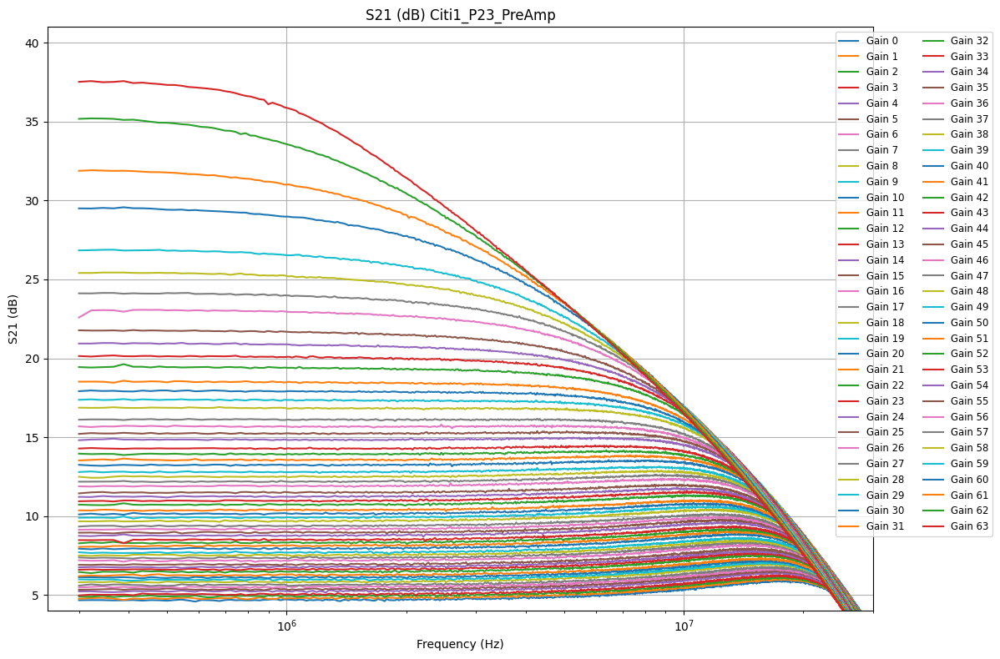

In [8]:
plt.figure(figsize=(12, 8))

# Loop through the preloaded data for Citi1_P23_PreAmp
for i in range(64):
    df_citi1_p23_preamp = data['Citi1_P23_PreAmp'][i]
    
    # Plot S21 (dB) vs Frequency (Hz)
    plt.plot(df_citi1_p23_preamp['Frequency (Hz)'], df_citi1_p23_preamp['S21 (dB)'], label=f'Gain {i}')

# Customize the plot
plt.xlabel('Frequency (Hz)')
plt.ylim(4, 41)
plt.ylabel('S21 (dB)')
plt.xscale('log')
plt.xlim(2.5e5, 3e7)
plt.title('S21 (dB) Citi1_P23_PreAmp')
plt.legend(loc='upper right', bbox_to_anchor=(1.15, 1), ncol=2, fontsize='small')
plt.tight_layout()
plt.grid()
plt.show()


### Citi2 P7 PreAmp

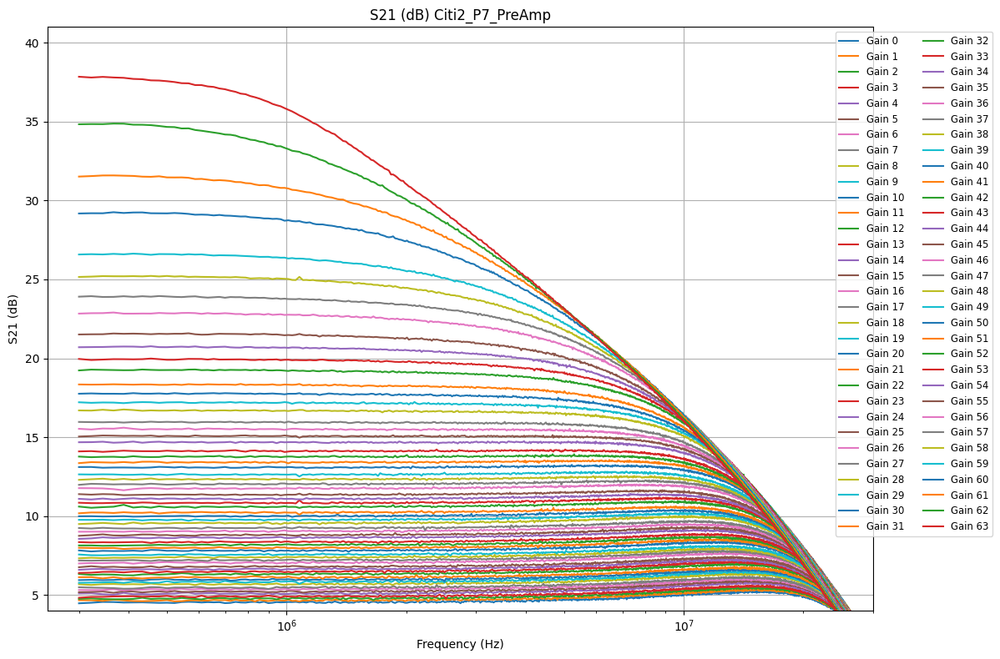

In [9]:
plt.figure(figsize=(12, 8))

# Loop through the preloaded data for Citi2_P7_PreAmp
for i in range(64):
    df_citi2_p7_preamp = data['Citi2_P7_PreAmp'][i]
    
    # Plot S21 (dB) vs Frequency (Hz)
    plt.plot(df_citi2_p7_preamp['Frequency (Hz)'], df_citi2_p7_preamp['S21 (dB)'], label=f'Gain {i}')


# Customize the plot
plt.xlabel('Frequency (Hz)')
plt.ylim(4, 41)
plt.ylabel('S21 (dB)')
plt.xscale('log')
plt.xlim(2.5e5, 3e7)
plt.title('S21 (dB) Citi2_P7_PreAmp')
plt.legend(loc='upper right', bbox_to_anchor=(1.15, 1), ncol=2, fontsize='small')
plt.tight_layout()
plt.grid()
plt.show()


### Citi2 P28 PreAmp

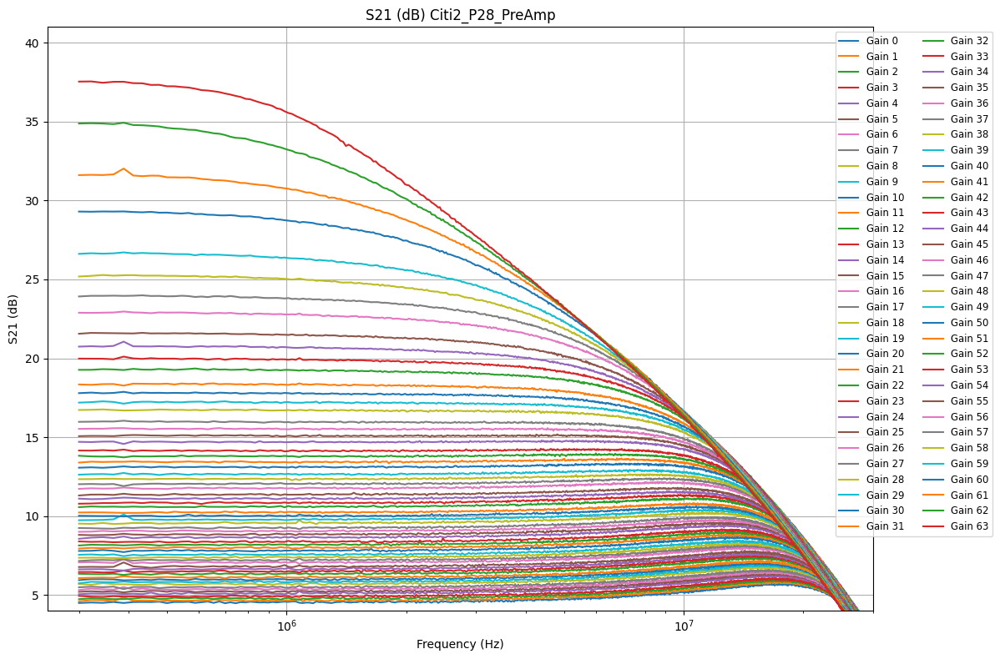

In [10]:
plt.figure(figsize=(12, 8))

# Loop through the preloaded data for Citi2_P28_PreAmp
for i in range(64):
    df_citi2_p28_preamp = data['Citi2_P28_PreAmp'][i]
    
    # Plot S21 (dB) vs Frequency (Hz)
    plt.plot(df_citi2_p28_preamp['Frequency (Hz)'], df_citi2_p28_preamp['S21 (dB)'], label=f'Gain {i}')

# Customize the plot
plt.xlabel('Frequency (Hz)')
plt.ylim(4, 41)
plt.ylabel('S21 (dB)')
plt.xscale('log')
plt.xlim(2.5e5, 3e7)
plt.title('S21 (dB) Citi2_P28_PreAmp')
plt.legend(loc='upper right', bbox_to_anchor=(1.15, 1), ncol=2, fontsize='small')
plt.tight_layout()
plt.grid()
plt.show()


# Comparacion Citi 1 - Puertos 12 y 23

### Comparacion de datos Crudos

Ploteo los datos crudos de ambos puertos, uno arriba del otro, para ver que onda. Hago esto separando los pares de los impares para que no quede tan lleno el grafico. 

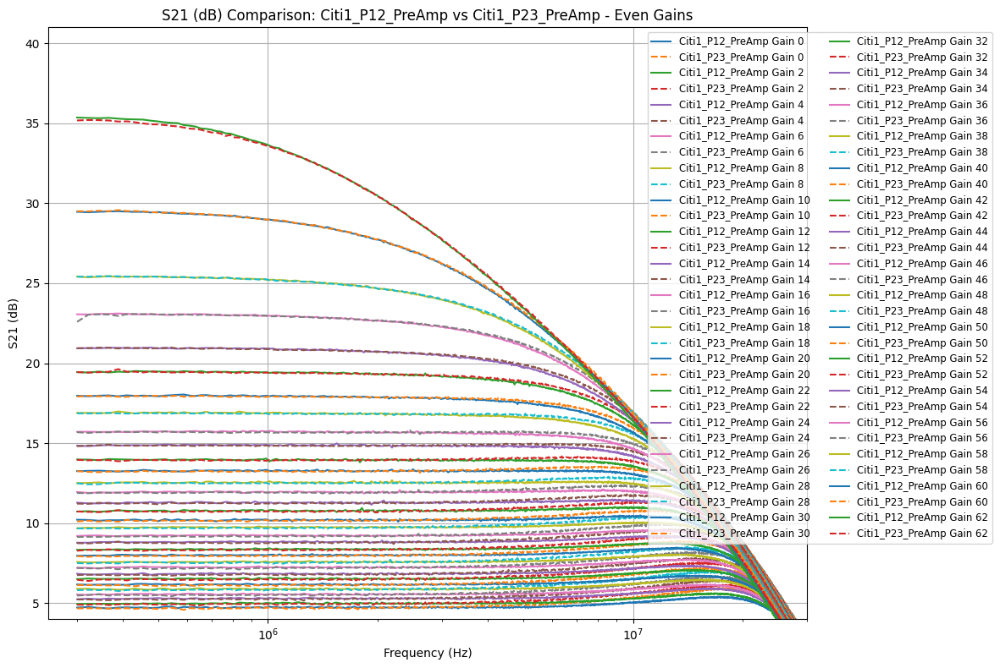

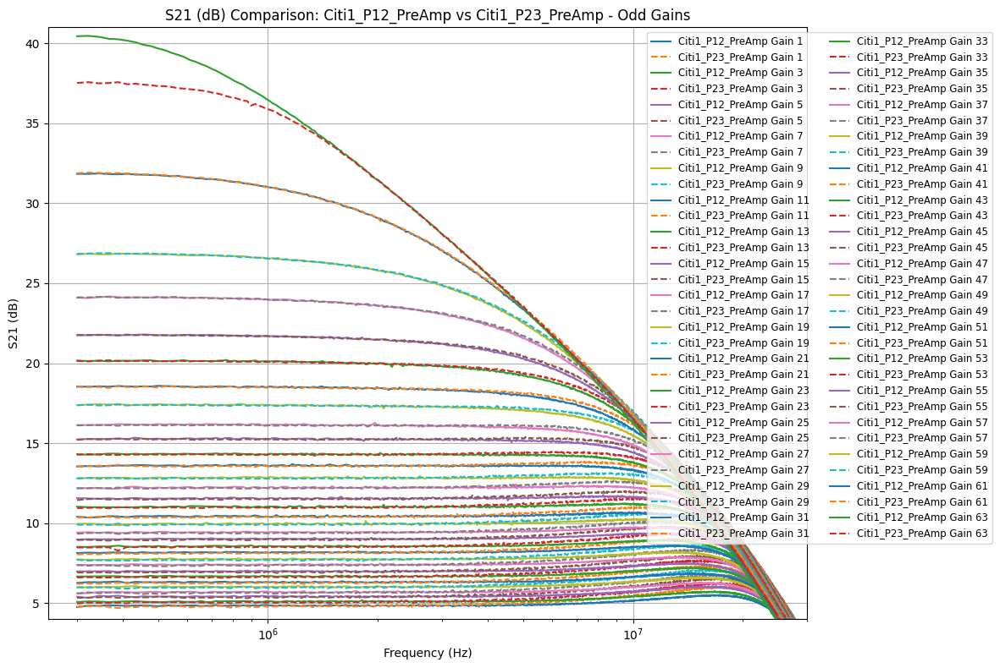

In [11]:
plot_even_odd_gains(data, dataset_1='Citi1_P12_PreAmp', dataset_2='Citi1_P23_PreAmp')

Se puede ver que los datos son super similares, salvo para la ganancia 63, que es muy parecido salvo al inicio que para el Citi1 P7 es muy grande la atenuacion (esto puede ser un dato medio outlier considerando ademas que las mediciones se hicieron en dias diferentes)

### Analisis de los residuos

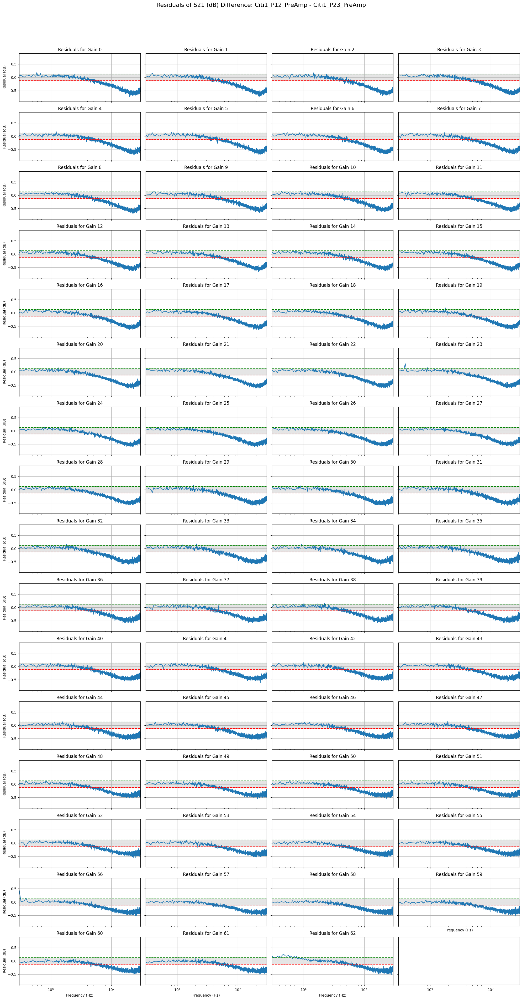

In [12]:
dataset_1_key = 'Citi1_P12_PreAmp'
dataset_2_key = 'Citi1_P23_PreAmp'
exclude_gains = [63]  # List of gains to exclude

residual_analysis = ResidualAnalysis(data, dataset_1_key, dataset_2_key, max_std=max_std_below_cutoff, frequency_cutoff=5e7, exclude_gains=exclude_gains)

# Perform residual analysis
residual_analysis.calculate_residuals_below_cutoff()
residual_analysis.calculate_residuals_above_cutoff()

# Generate plots
residual_analysis.plot_residuals()  # Plots residuals for all valid gains

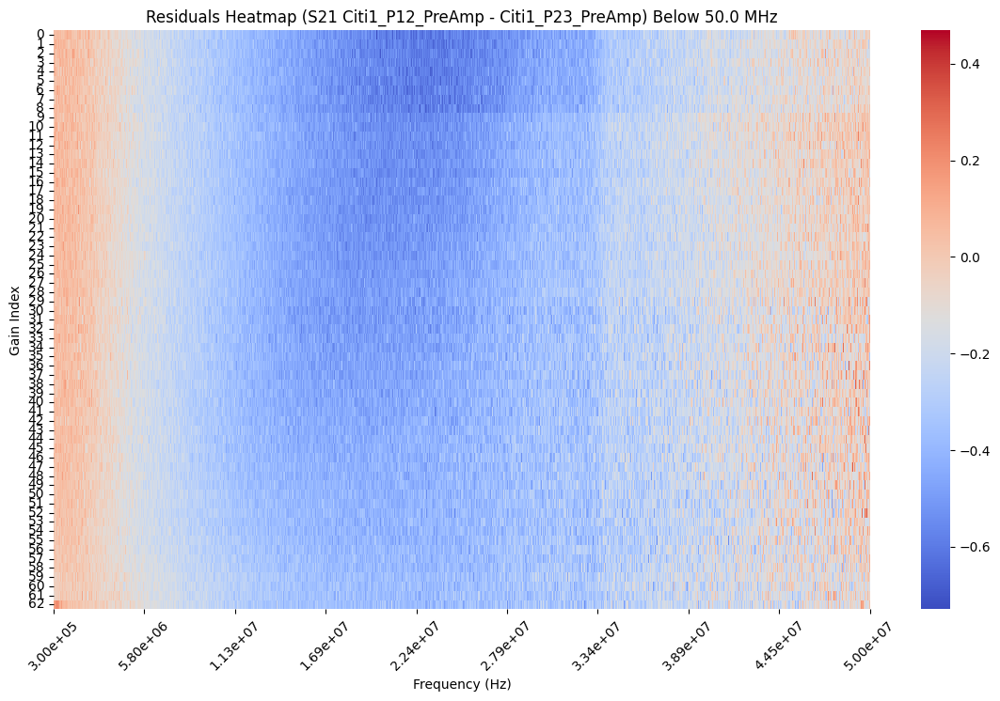

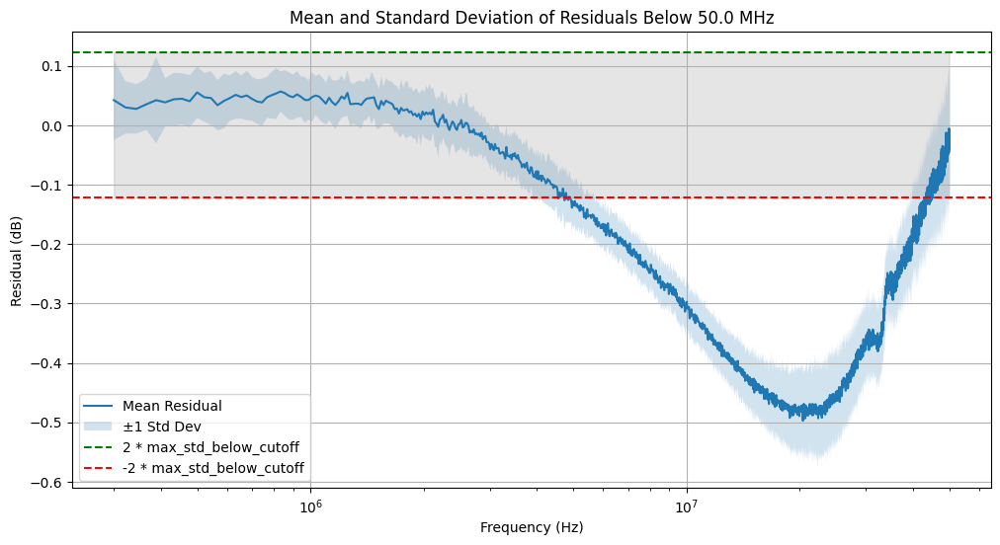

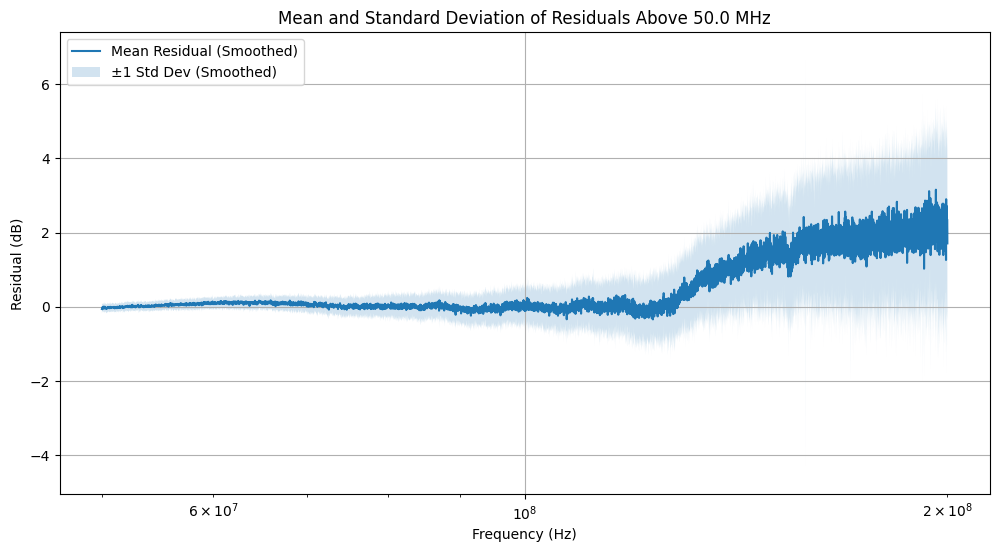

In [13]:
residual_analysis.plot_heatmap_below_cutoff()
residual_analysis.plot_mean_and_std_below_cutoff()
residual_analysis.plot_mean_and_std_above_cutoff()

# Comparacion Citi2 - Puertos 7 y 28

### Comparacion de los datos crudos

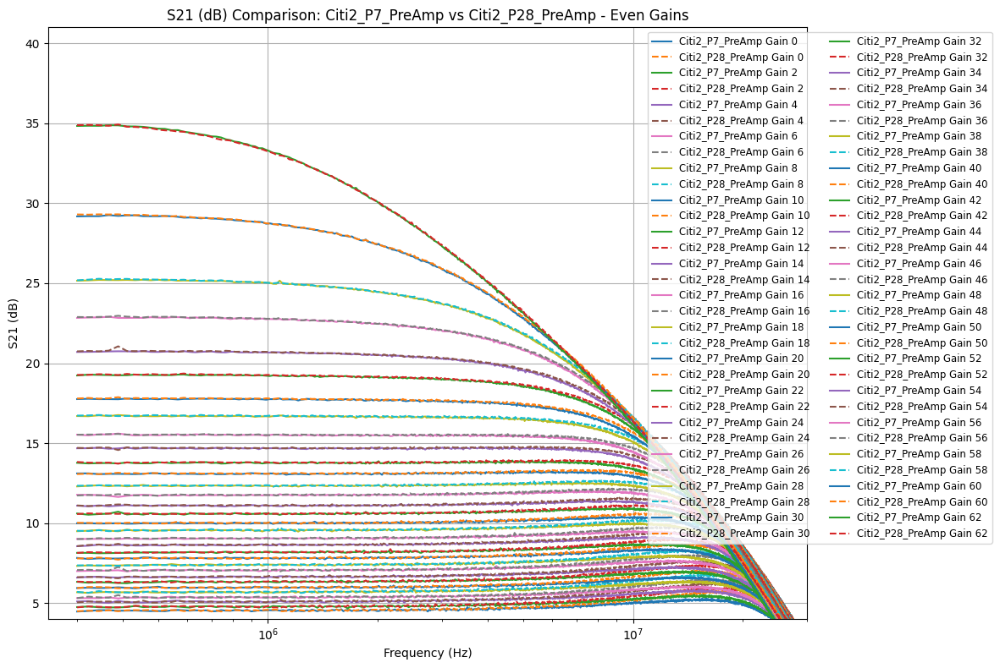

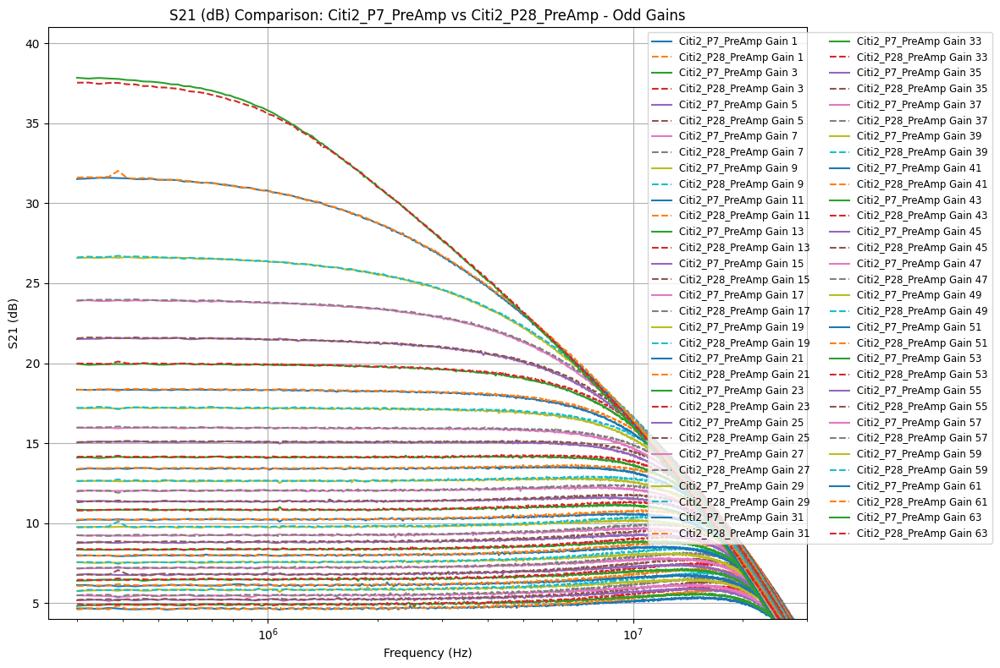

In [14]:
plot_even_odd_gains(data, dataset_1='Citi2_P7_PreAmp', dataset_2='Citi2_P28_PreAmp')

### Analisis de los residuos

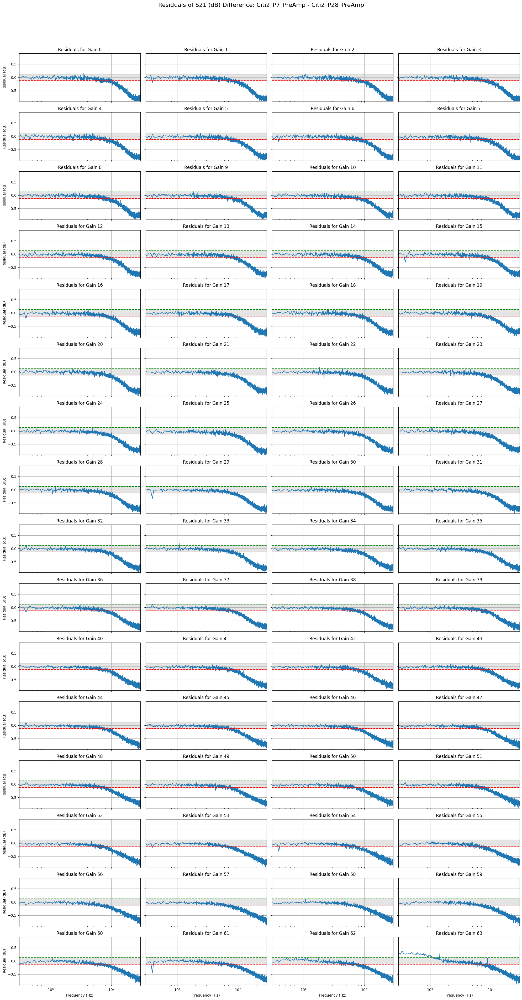

In [15]:
dataset_1_key = 'Citi2_P7_PreAmp'
dataset_2_key = 'Citi2_P28_PreAmp'

residual_analysis = ResidualAnalysis(data, dataset_1_key, dataset_2_key, max_std=max_std_below_cutoff, frequency_cutoff=5e7)

# Perform residual analysis
residual_analysis.calculate_residuals_below_cutoff()
residual_analysis.calculate_residuals_above_cutoff()

# Generate plots
residual_analysis.plot_residuals()  # Plots residuals for all valid gains

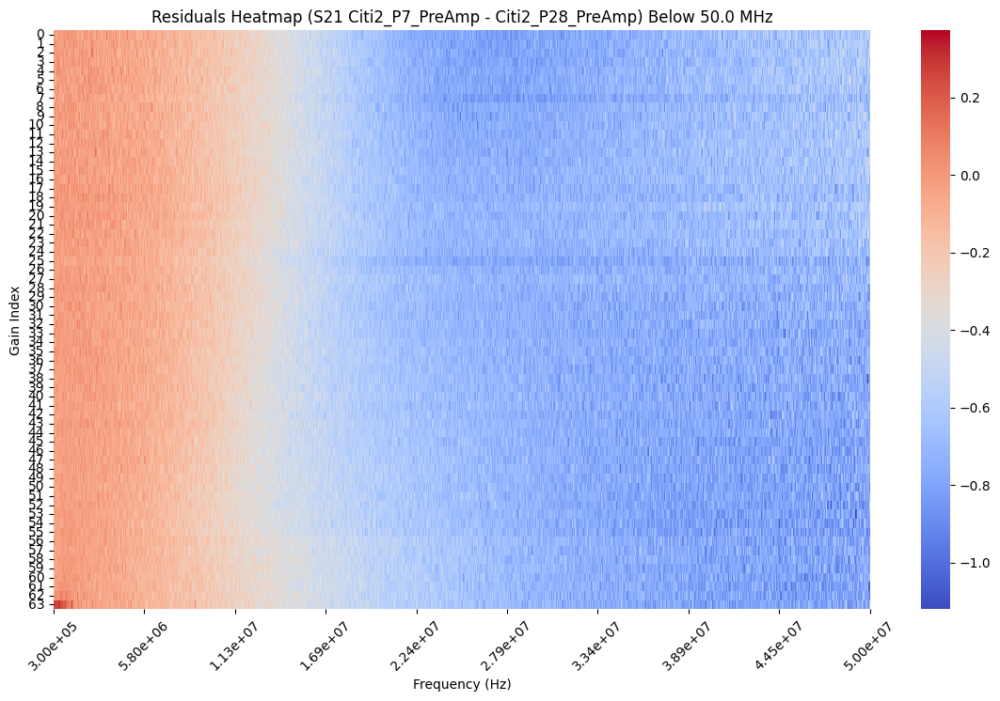

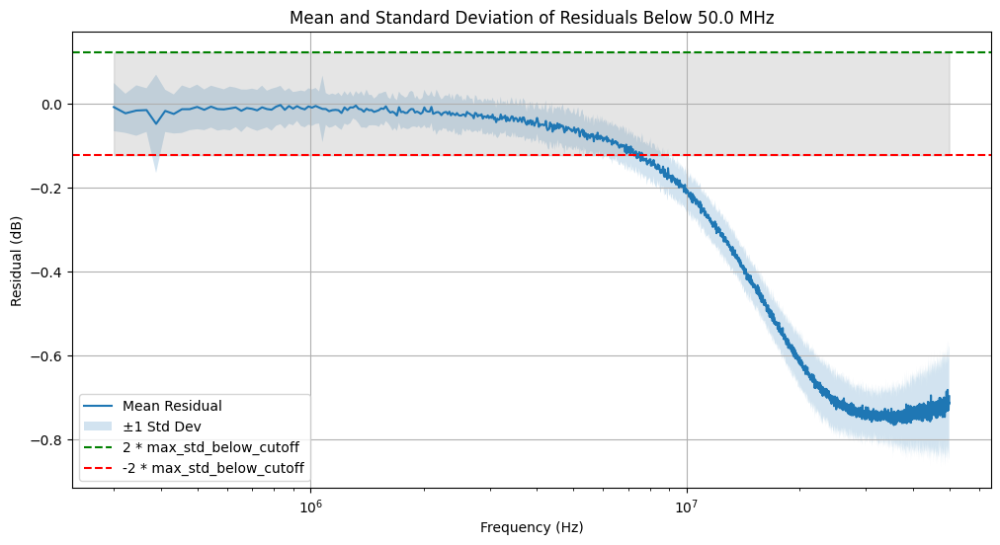

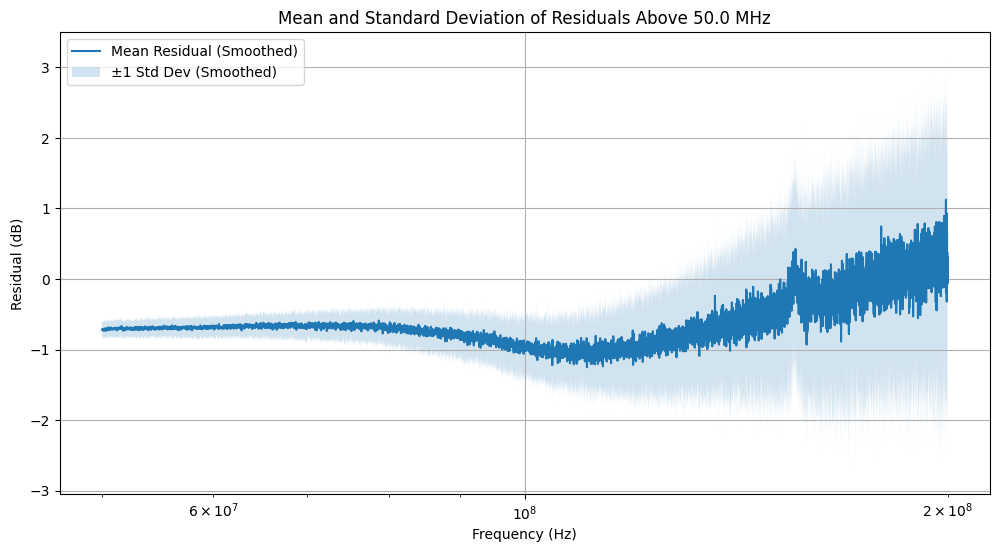

In [16]:
residual_analysis.plot_heatmap_below_cutoff()
residual_analysis.plot_mean_and_std_below_cutoff()
residual_analysis.plot_mean_and_std_above_cutoff()

# Comparacion Citi1-Citi2

## Citi1_P23 vs Citi2_P28

### Comparacion datos crudos

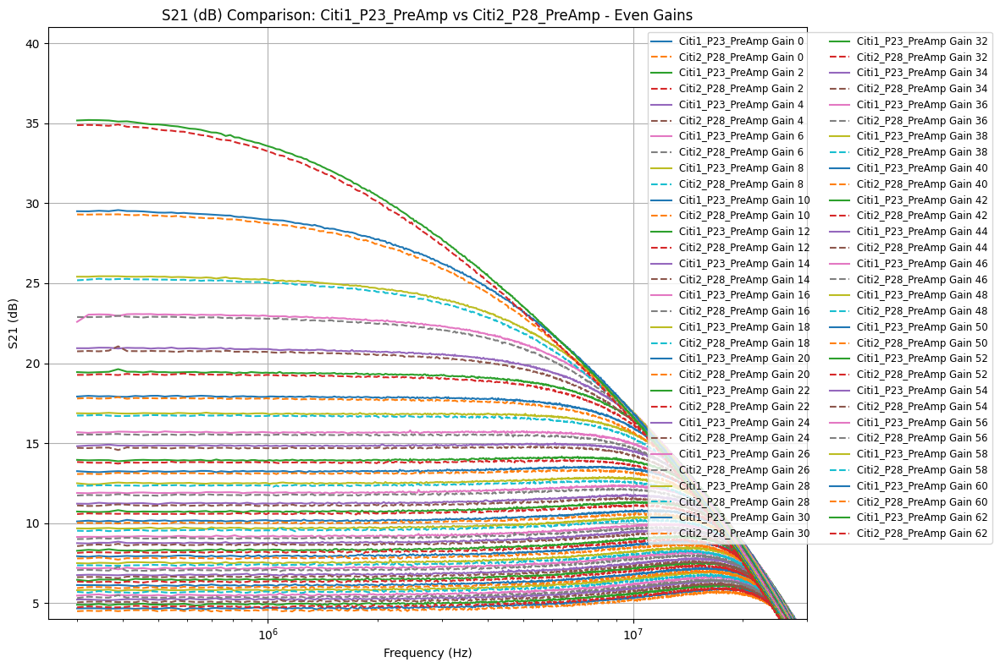

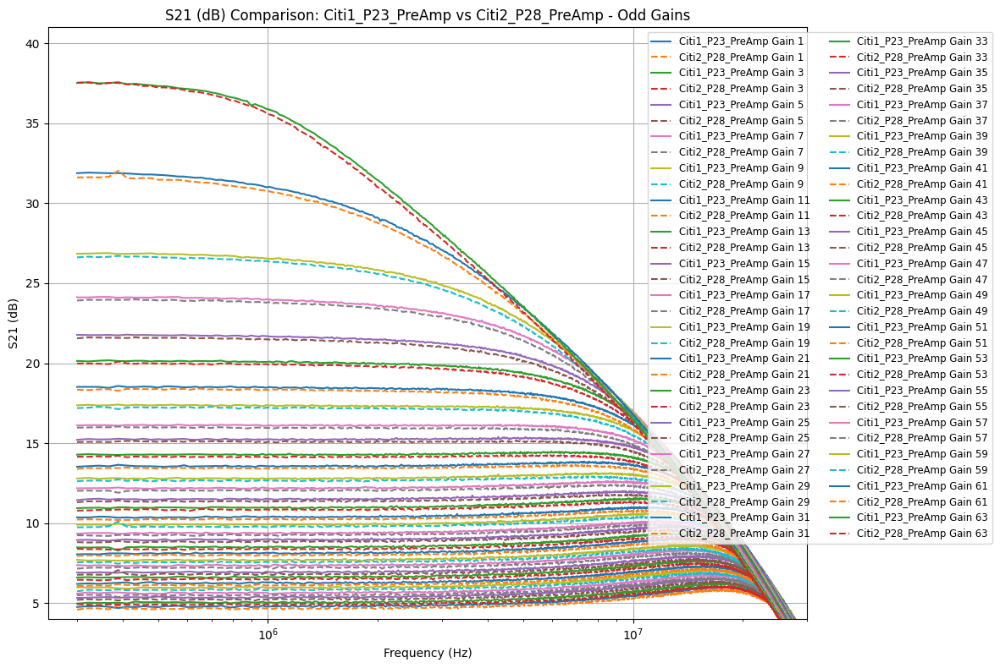

In [17]:
plot_even_odd_gains(data, dataset_1='Citi1_P23_PreAmp', dataset_2='Citi2_P28_PreAmp')

No se ven mayores diferencias ni cosas sistematicas, salvo que parece que consistentemente los valores de Citi2_P28 son menores pero iguales a los del Citi1_23

### Analisis de los residuos

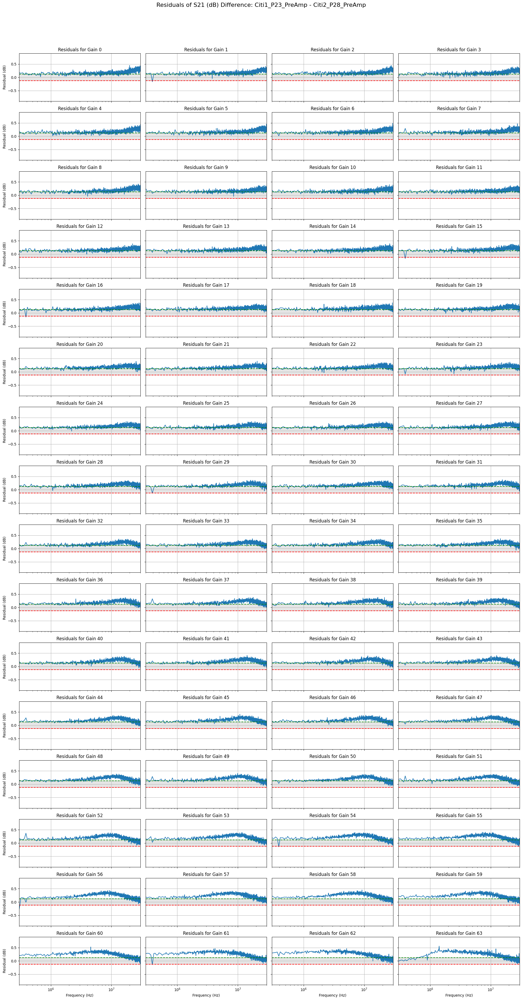

In [18]:
dataset_1_key = 'Citi1_P23_PreAmp'
dataset_2_key = 'Citi2_P28_PreAmp'

residual_analysis = ResidualAnalysis(data, dataset_1_key, dataset_2_key, max_std=max_std_below_cutoff, frequency_cutoff=5e7)

# Perform residual analysis
residual_analysis.calculate_residuals_below_cutoff()
residual_analysis.calculate_residuals_above_cutoff()

# Generate plots
residual_analysis.plot_residuals()  # Plots residuals for all valid gains

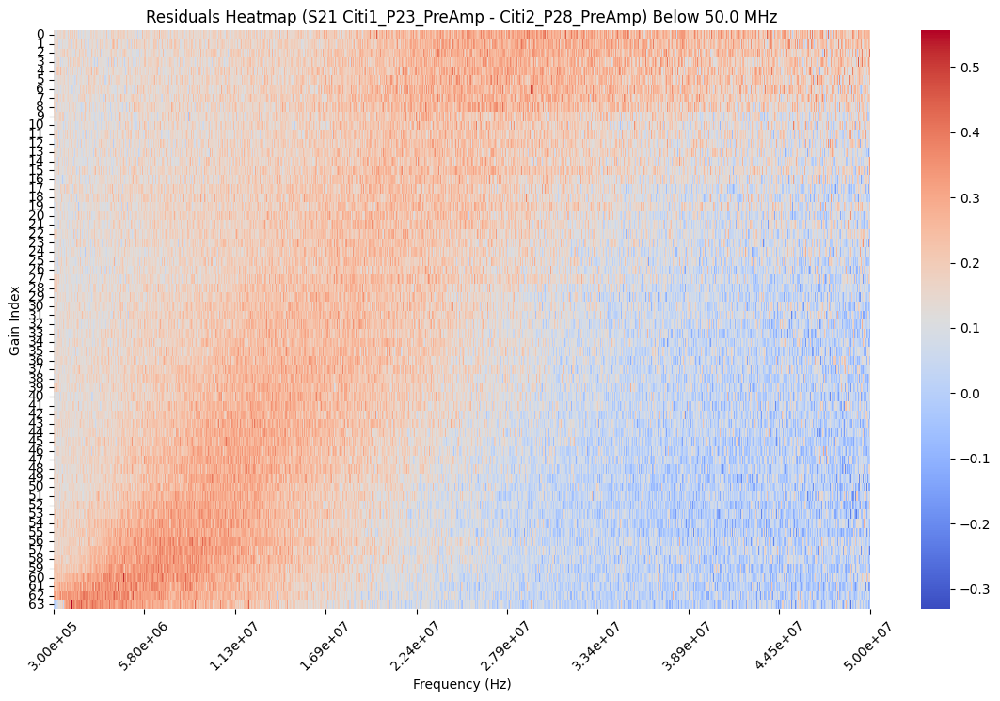

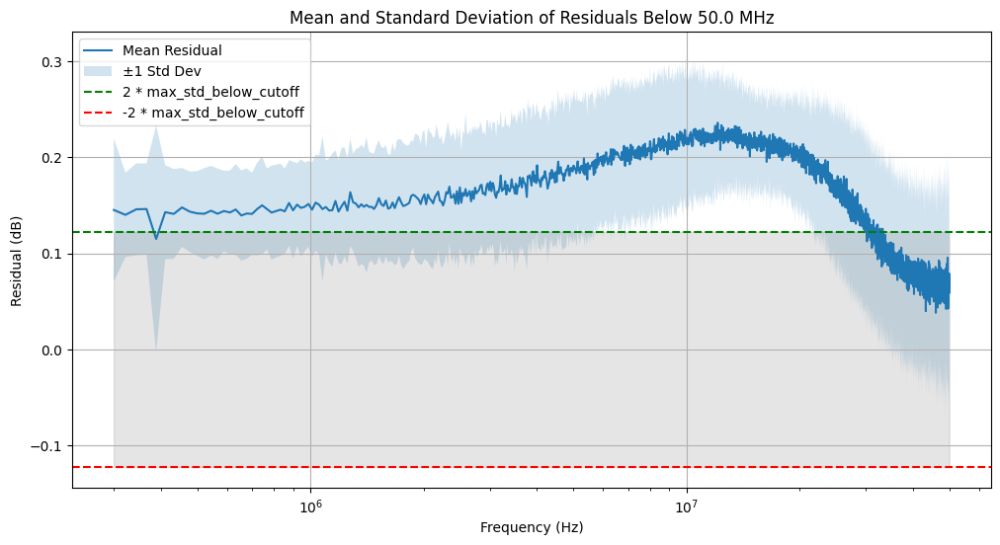

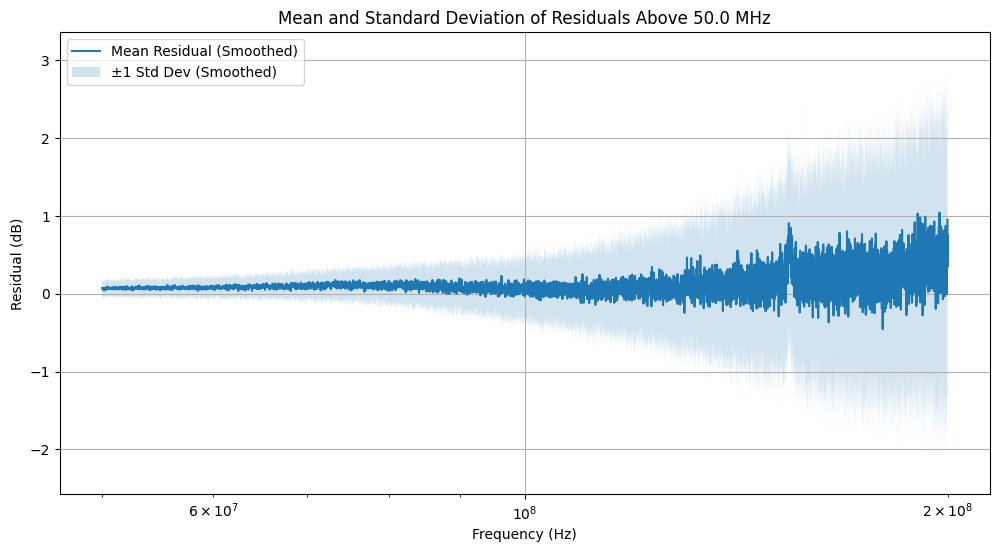

In [19]:
residual_analysis.plot_heatmap_below_cutoff()
residual_analysis.plot_mean_and_std_below_cutoff()
residual_analysis.plot_mean_and_std_above_cutoff()

## Citi1_P12 vs Citi2_P28

### Comparacion datos crudos

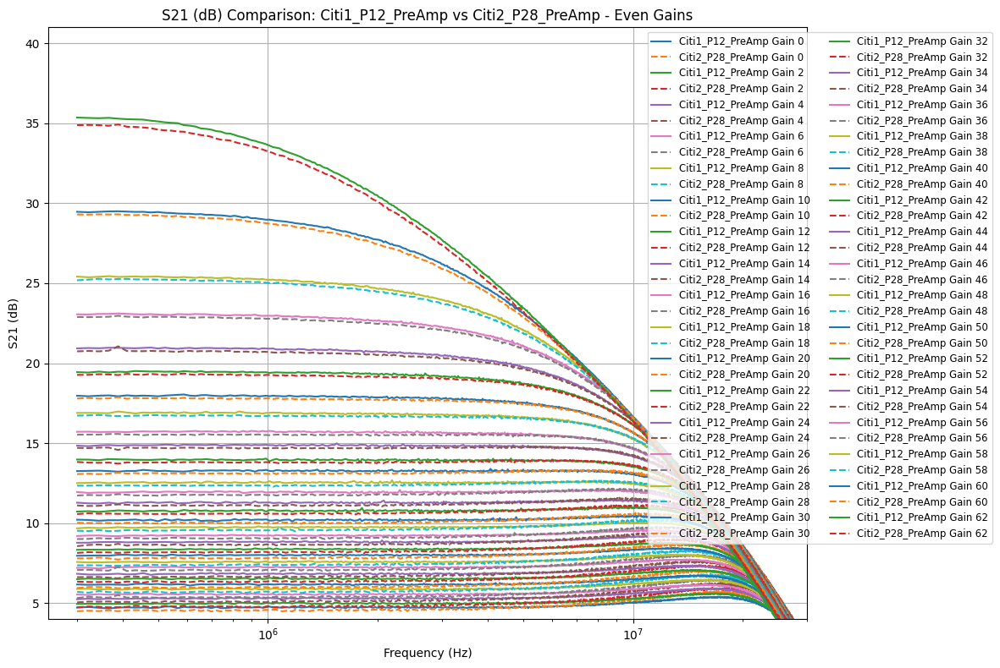

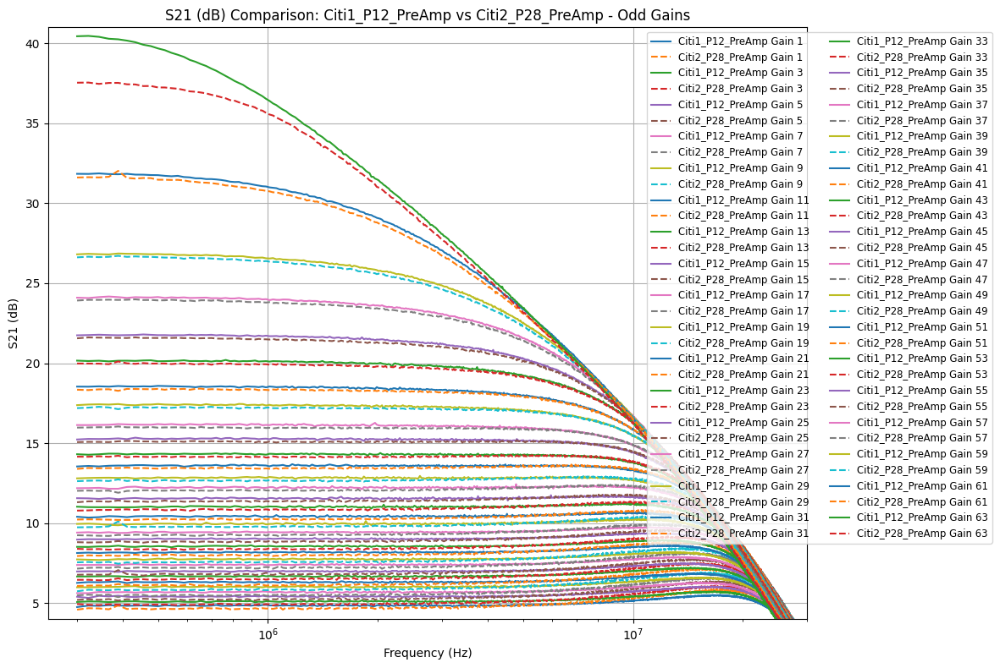

In [20]:
plot_even_odd_gains(data, dataset_1='Citi1_P12_PreAmp', dataset_2='Citi2_P28_PreAmp')

### Analisis de los residuos

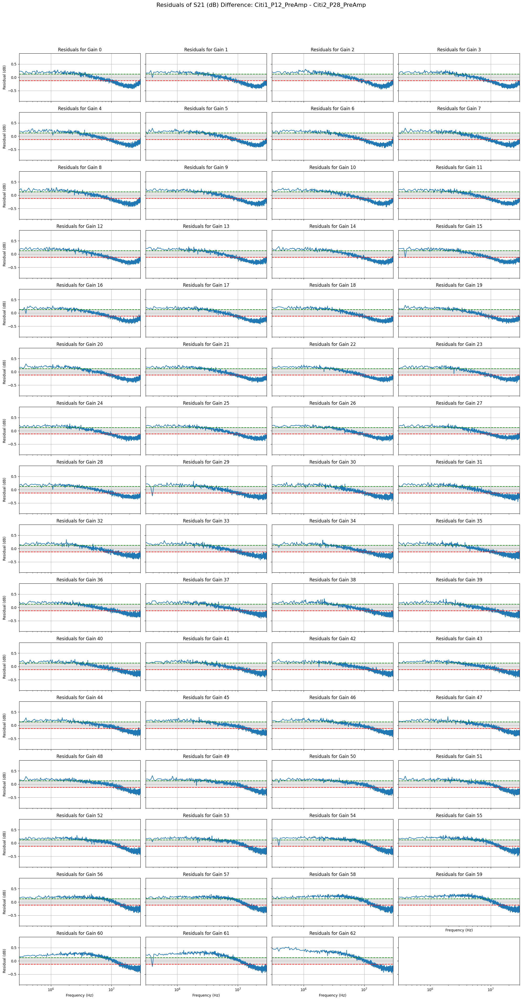

In [21]:
dataset_1_key = 'Citi1_P12_PreAmp'
dataset_2_key = 'Citi2_P28_PreAmp'
exclude_gains = [63]  # List of gains to exclude

residual_analysis = ResidualAnalysis(data, dataset_1_key, dataset_2_key, max_std=max_std_below_cutoff, frequency_cutoff=5e7, exclude_gains=exclude_gains)


# Perform residual analysis
residual_analysis.calculate_residuals_below_cutoff()
residual_analysis.calculate_residuals_above_cutoff()

# Generate plots
residual_analysis.plot_residuals()  # Plots residuals for all valid gains

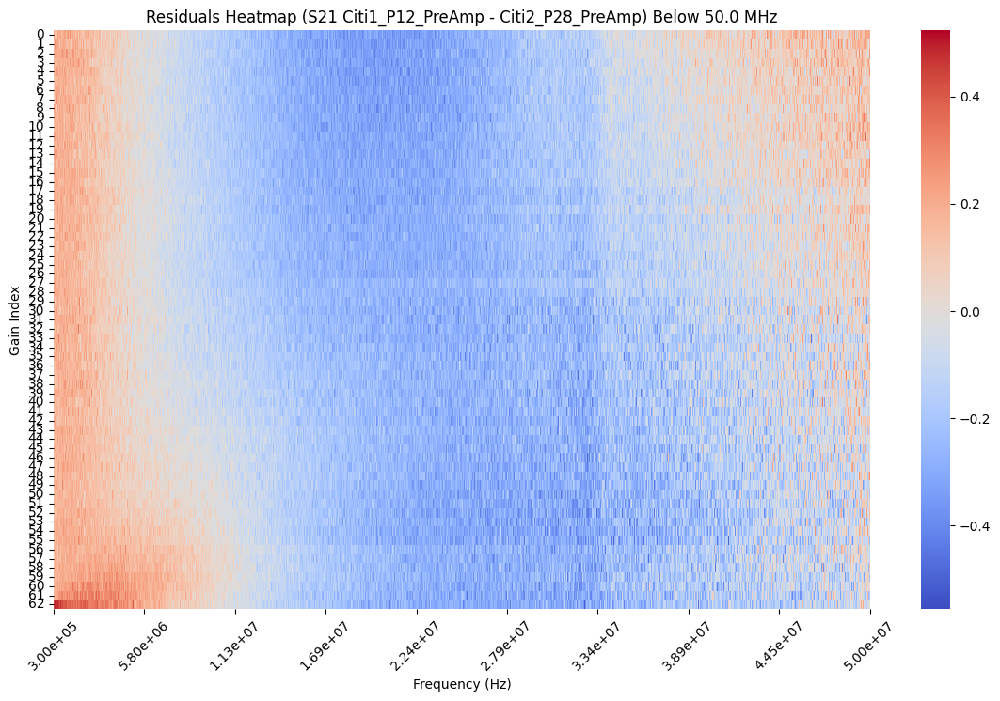

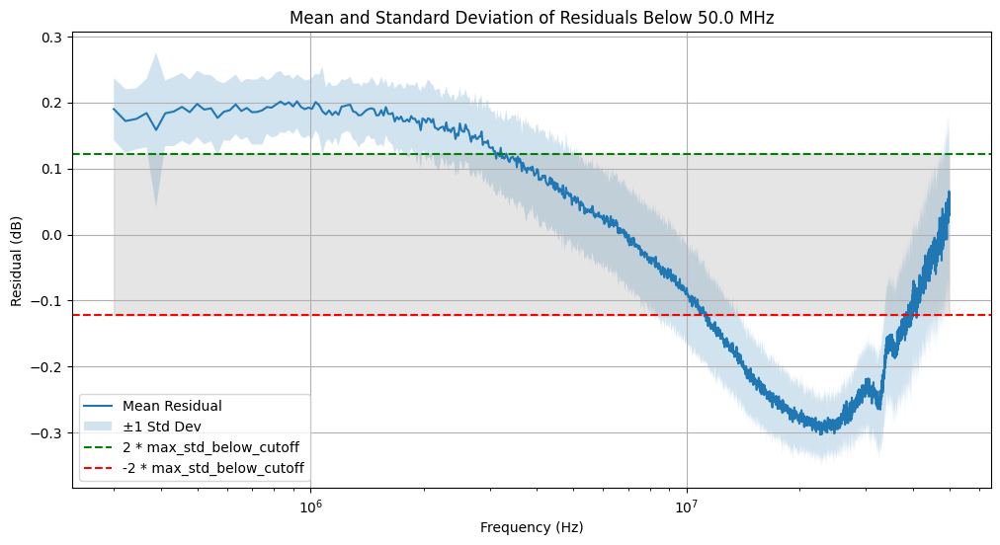

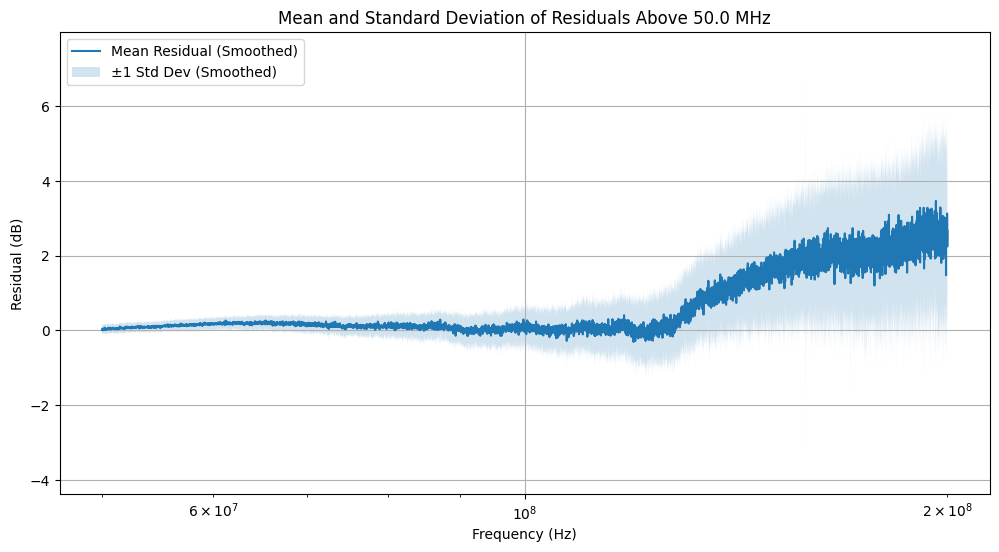

In [22]:
residual_analysis.plot_heatmap_below_cutoff()
residual_analysis.plot_mean_and_std_below_cutoff()
residual_analysis.plot_mean_and_std_above_cutoff()

## Citi1_P12 vs Citi2_P7

### Comparacion datos crudos

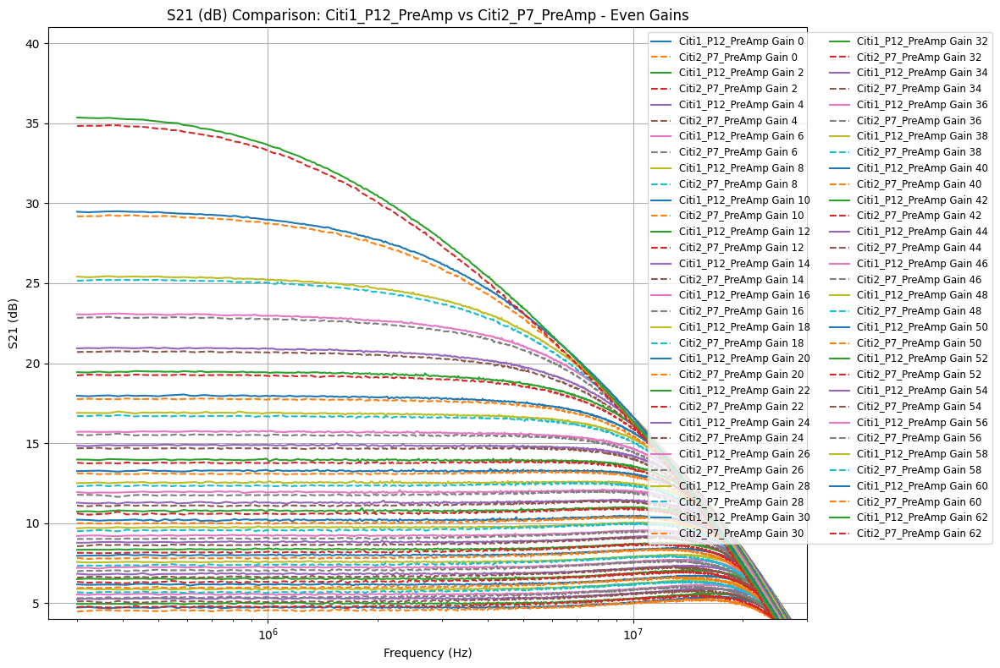

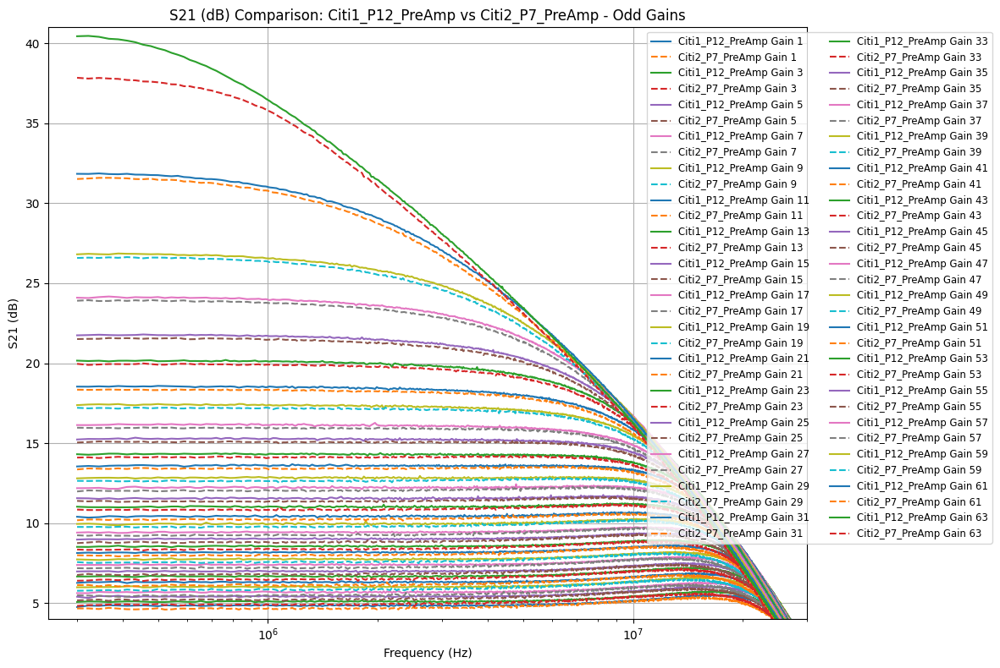

In [23]:
plot_even_odd_gains(data, dataset_1='Citi1_P12_PreAmp', dataset_2='Citi2_P7_PreAmp')

### Analisis de los residuos

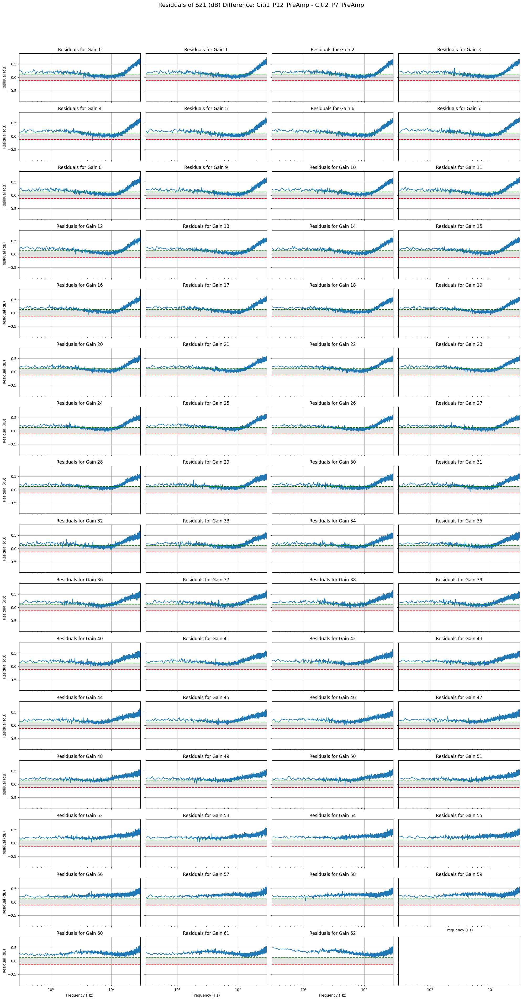

In [24]:
dataset_1_key = 'Citi1_P12_PreAmp'
dataset_2_key = 'Citi2_P7_PreAmp'
exclude_gains = [63]  # List of gains to exclude

residual_analysis = ResidualAnalysis(data, dataset_1_key, dataset_2_key, max_std=max_std_below_cutoff, frequency_cutoff=5e7, exclude_gains=exclude_gains)


# Perform residual analysis
residual_analysis.calculate_residuals_below_cutoff()
residual_analysis.calculate_residuals_above_cutoff()

# Generate plots
residual_analysis.plot_residuals()  # Plots residuals for all valid gains

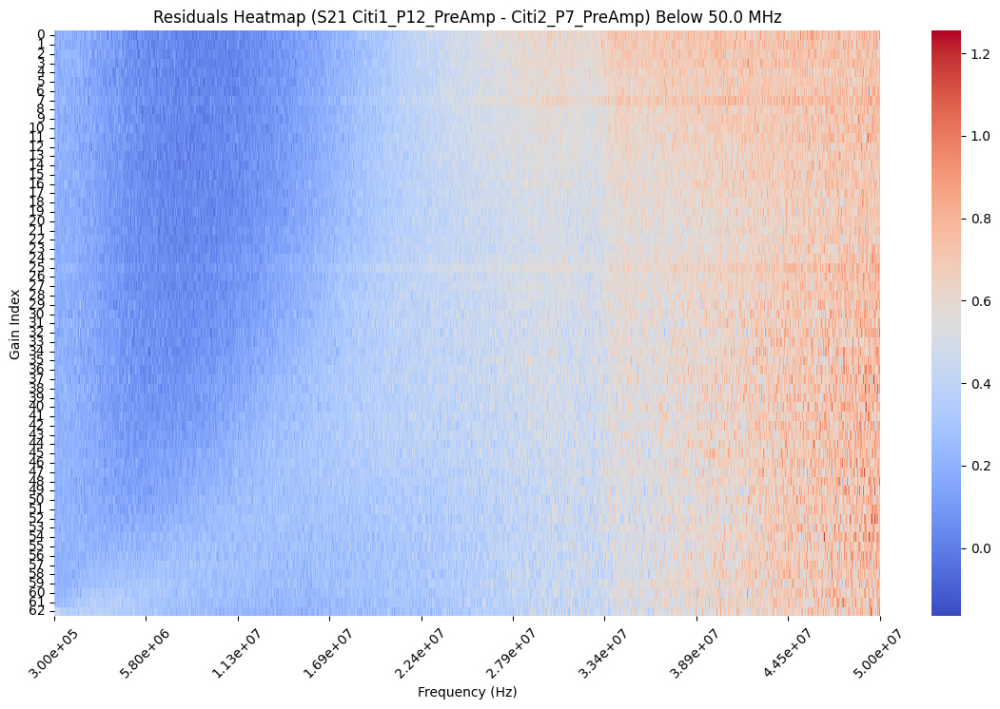

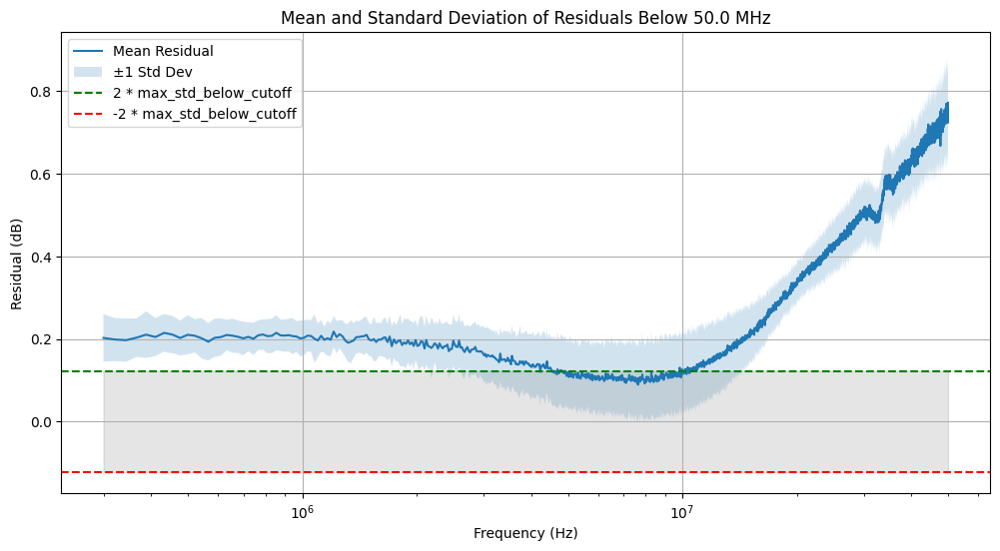

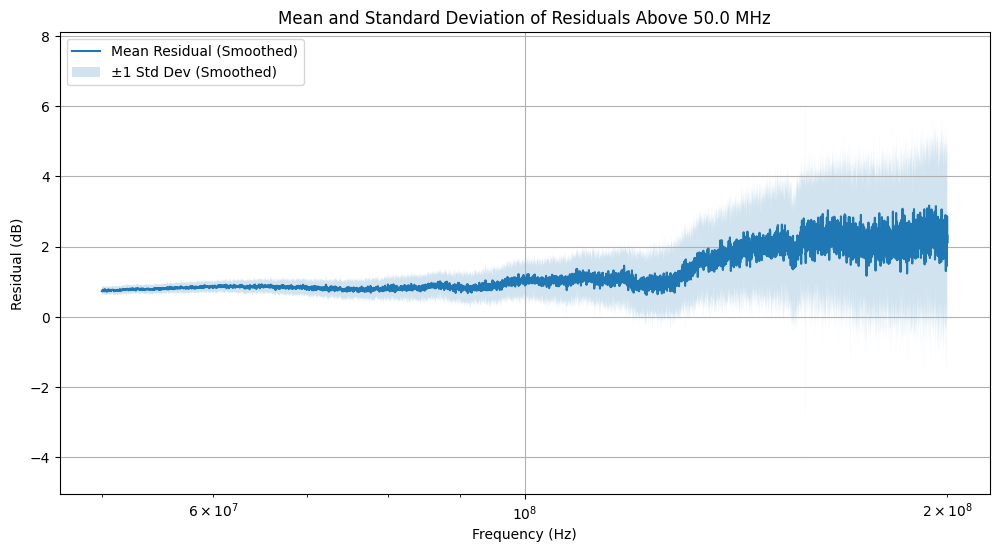

In [25]:
residual_analysis.plot_heatmap_below_cutoff()
residual_analysis.plot_mean_and_std_below_cutoff()
residual_analysis.plot_mean_and_std_above_cutoff()

# f